# Changing thresh

In [1]:
%cd ~/gan/bin/TreeSeg/
!pwd

import json
import math
import os
from pathlib import Path

# import hashlib
import matplotlib.pyplot as plt
# import networkx as nx
# import nvdiffrast.torch as dr
import torch
# from torch import Tensor, nn
# import torch.nn.functional as F
import numpy as np
# from tqdm import tqdm
# import yaml
import cv2
# from rich.console import Console
from rich.tree import Tree
# import torch_geometric as pyg

import tree_segmentation as ts
import tree_segmentation.extension as ext
from tree_segmentation.extension import ops_3d, Mesh, utils
from semantic_sam import SemanticSAM, semantic_sam_l, semantic_sam_t
from segment_anything import build_sam
from tree_segmentation import  TreePredictor, TreeSegmentMetric, Tree2D, MaskData
from tree_segmentation.util import show_masks, show_all_levels, image_add_mask_boundary
# import pycocotools.mask as mask_util

/home/study/gan/bin/TreeSeg
/home/study/gan/bin/TreeSeg
Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [2]:
print(torch.__version__)
%load_ext autoreload
%autoreload 2
%matplotlib inline
torch.set_grad_enabled(False)
# console = Console()
device = torch.device("cuda")
# device = torch.device("cpu")
utils.set_printoptions(linewidth=120)

2.0.1+cu117


In [3]:
!pwd

/home/study/gan/bin/TreeSeg


Load image

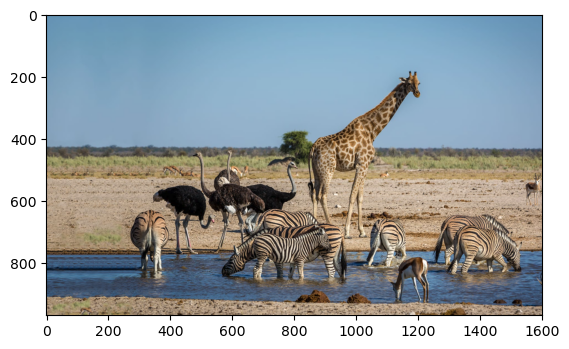

In [4]:
img_path = f"./images/animals.png"
image = utils.load_image(img_path)
plt.imshow(image)

Load SAM

In [24]:
# load SAM
assert torch.cuda.is_available()
model = build_sam(Path('./weights/sam_vit_h_4b8939.pth').expanduser())
# model = semantic_sam_l(Path("./weights/swinl_only_sam_many2many.pth").expanduser())
# model = semantic_sam_t( Path("./weights/swint_only_sam_many2many.pth").expanduser())
model = model.eval().to(device)

设定模型参数

In [25]:
tree_seg = TreePredictor(
    model, 
    box_nms_thresh=0.9,               
    pred_iou_thresh = 0.88,
    stability_score_thresh = 0.95,
)

(970, 1602, 3)
(620, 1024, 3)


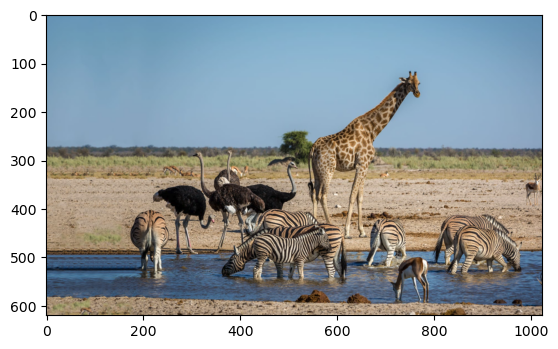

In [26]:
print(image.shape)
H, W, _ = image.shape
scale = min(1024 / H, 1024 / W)
image_resized = cv2.resize(image, (int(scale * W), int(scale * H)), interpolation=cv2.INTER_AREA)
print(image_resized.shape)
plt.imshow(image_resized)

In [27]:
prediction = tree_seg.tree_generate(image_resized, device=device, verbose=0, max_steps=100)

num of masks: 69


4

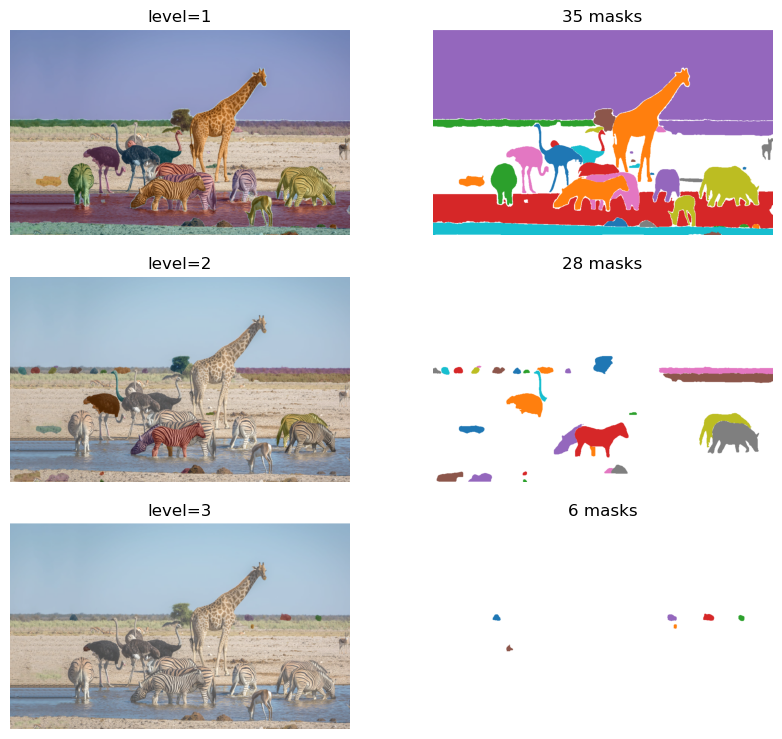

In [28]:
# prediction.print_tree()
print(f"num of masks: {prediction.num_masks}")
show_all_levels(image_resized, prediction)

下面改变`stability_score_thresh`

Generating tree.
num of masks: 83


5

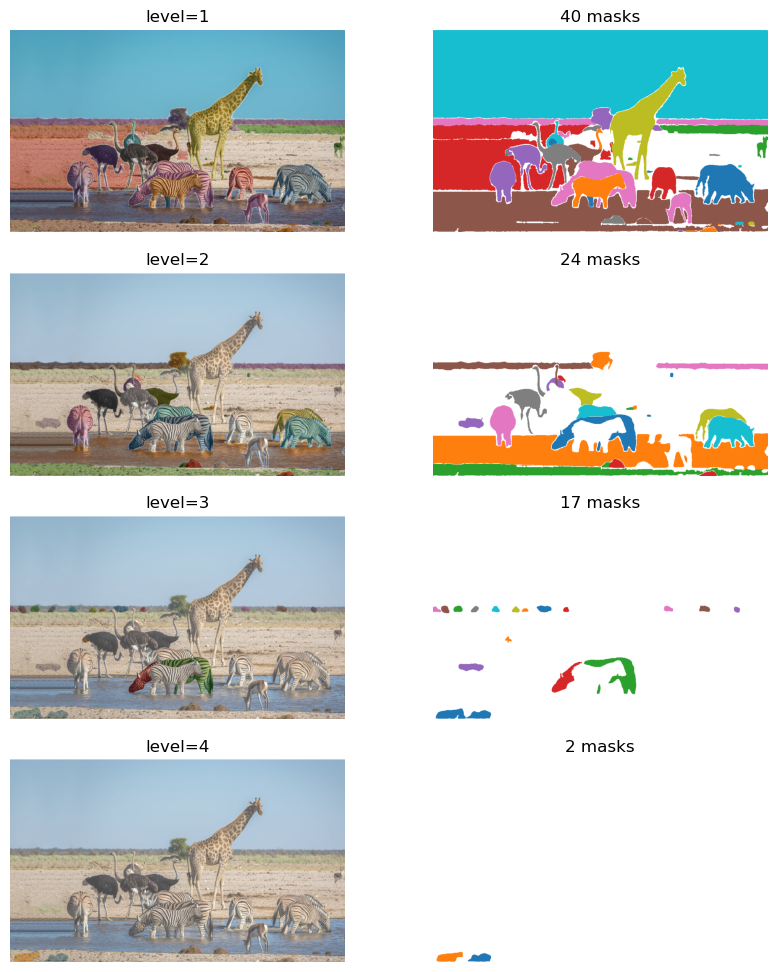

In [29]:
tree_seg = TreePredictor(
    model, 
    box_nms_thresh=0.9,               
    pred_iou_thresh = 0.88,
    stability_score_thresh = 0.9,
)
print("Generating tree.")
prediction = tree_seg.tree_generate(image_resized, device=device, verbose=0, max_steps=100)
# prediction.print_tree()
print(f"num of masks: {prediction.num_masks}")
show_all_levels(image_resized, prediction)

Generating tree.


num of masks: 87


7

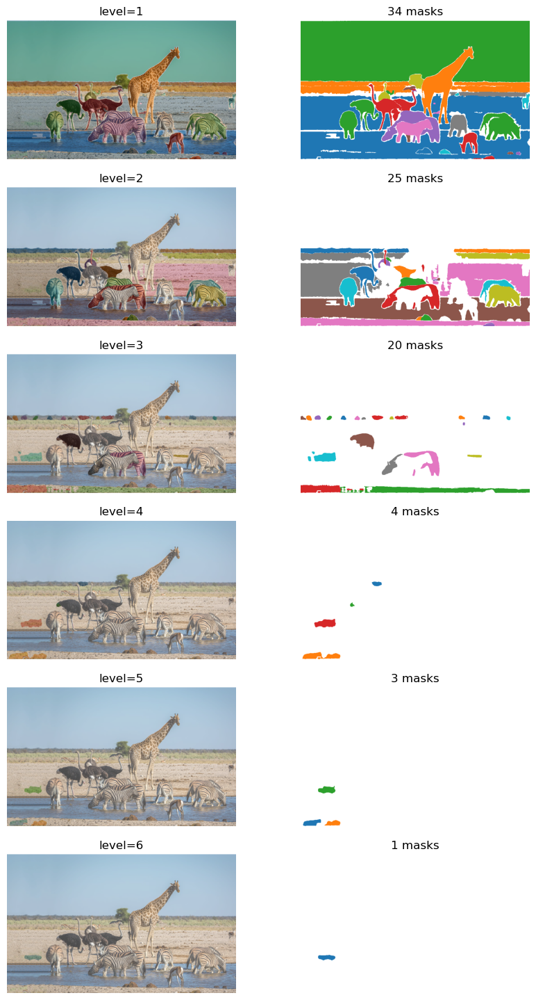

In [30]:
tree_seg = TreePredictor(
    model, 
    box_nms_thresh=0.9,               
    pred_iou_thresh = 0.88,
    stability_score_thresh = 0.8,
)
print("Generating tree.")
prediction = tree_seg.tree_generate(image_resized, device=device, verbose=0, max_steps=100)
# prediction.print_tree()
print(f"num of masks: {prediction.num_masks}")
show_all_levels(image_resized, prediction)

Generating tree.


num of masks: 96


6

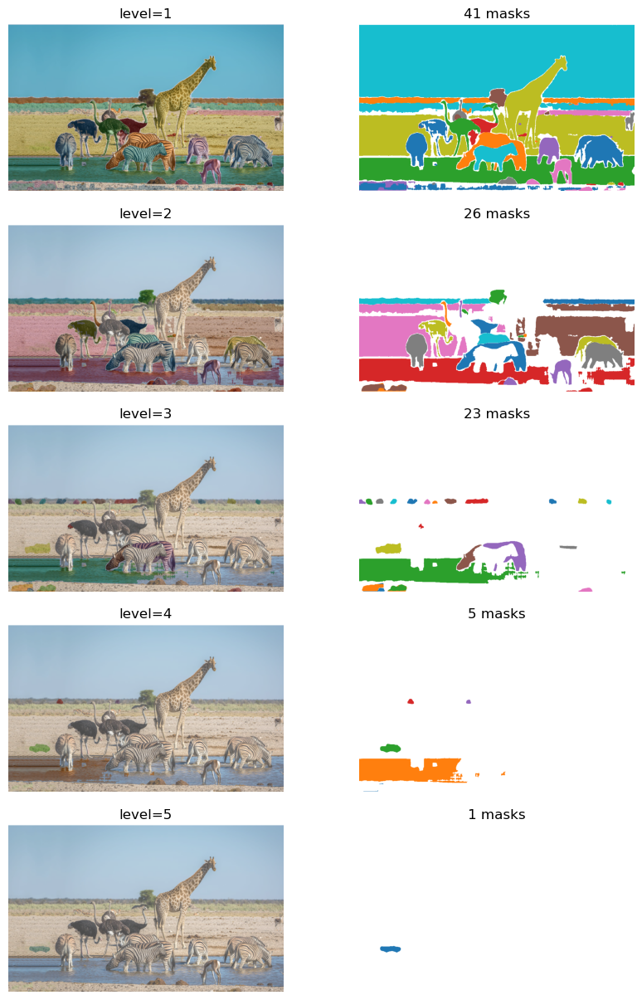

In [31]:
tree_seg = TreePredictor(
    model, 
    box_nms_thresh=0.9,               
    pred_iou_thresh = 0.88,
    stability_score_thresh = 0.7,
)
print("Generating tree.")
prediction = tree_seg.tree_generate(image_resized, device=device, verbose=0, max_steps=100)
# prediction.print_tree()
print(f"num of masks: {prediction.num_masks}")
show_all_levels(image_resized, prediction)

Generating tree.


num of masks: 100


10

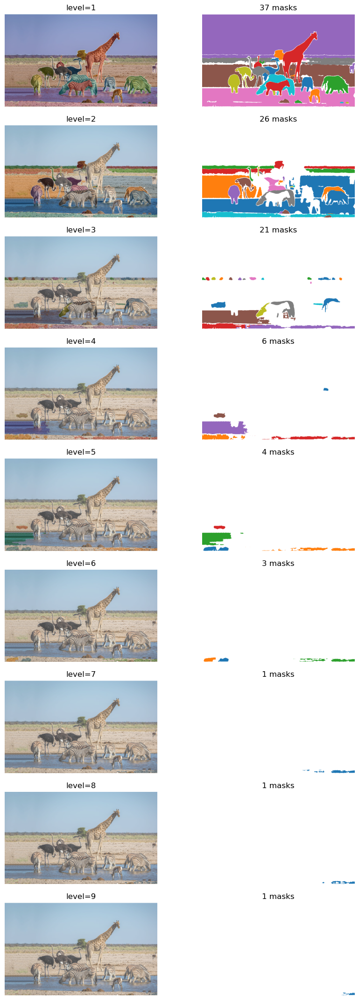

In [32]:
tree_seg = TreePredictor(
    model, 
    box_nms_thresh=0.9,               
    pred_iou_thresh = 0.88,
    stability_score_thresh = 0.5,
)
print("Generating tree.")
prediction = tree_seg.tree_generate(image_resized, device=device, verbose=0, max_steps=100)
# prediction.print_tree()
print(f"num of masks: {prediction.num_masks}")
show_all_levels(image_resized, prediction)

下面改变`pred_iou_thresh`

Generating tree.


num of masks: 113


5

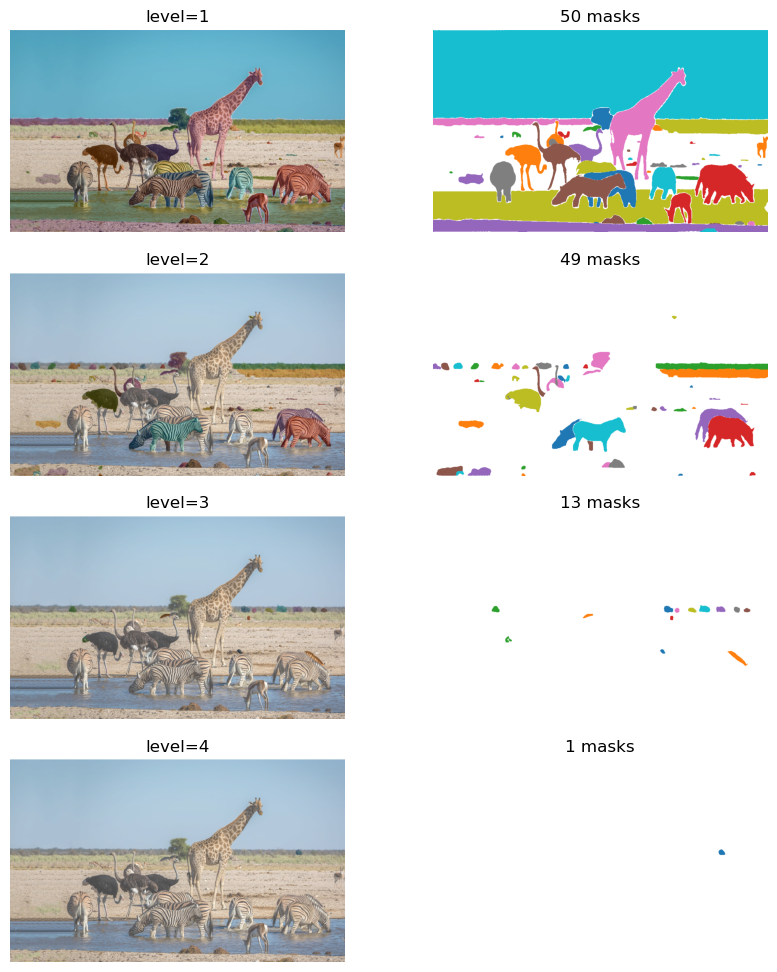

In [33]:
tree_seg = TreePredictor(
    model, 
    box_nms_thresh=0.9,               
    pred_iou_thresh = 0.8,
    stability_score_thresh = 0.95,
)
print("Generating tree.")
prediction = tree_seg.tree_generate(image_resized, device=device, verbose=0, max_steps=100)
# prediction.print_tree()
print(f"num of masks: {prediction.num_masks}")
show_all_levels(image_resized, prediction)

Generating tree.


num of masks: 128


4

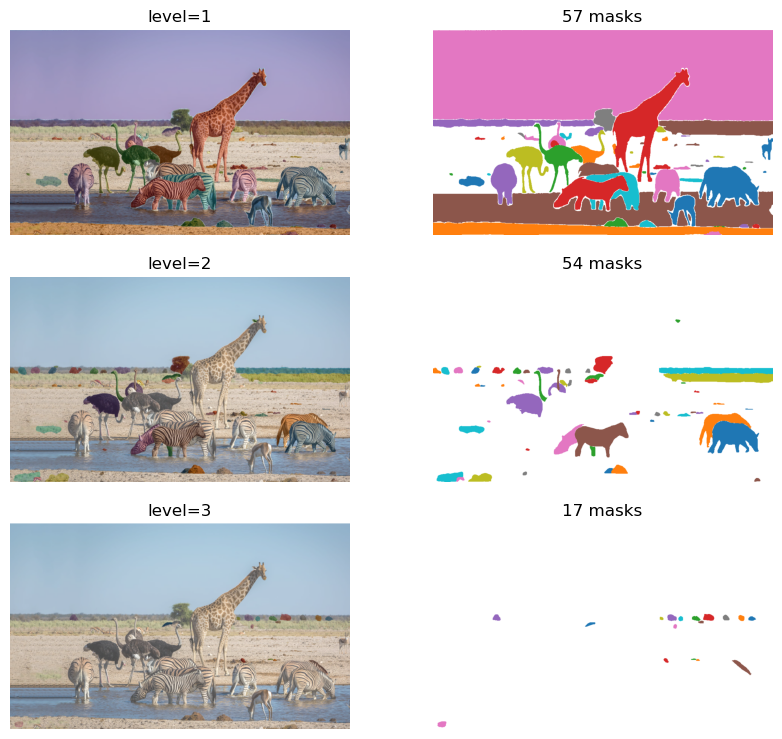

In [34]:
tree_seg = TreePredictor(
    model, 
    box_nms_thresh=0.9,               
    pred_iou_thresh = 0.7,
    stability_score_thresh = 0.95,
)
print("Generating tree.")
prediction = tree_seg.tree_generate(image_resized, device=device, verbose=0, max_steps=100)
# prediction.print_tree()
print(f"num of masks: {prediction.num_masks}")
show_all_levels(image_resized, prediction)

Generating tree.
num of masks: 138


5

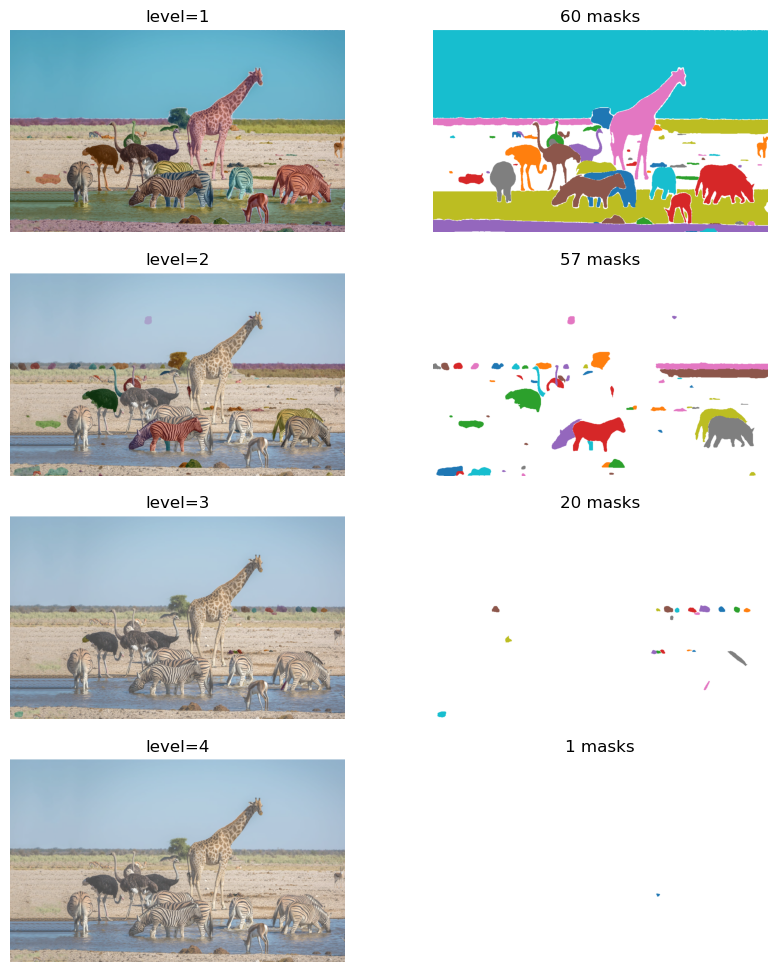

In [35]:
tree_seg = TreePredictor(
    model, 
    box_nms_thresh=0.9,               
    pred_iou_thresh = 0.5,
    stability_score_thresh = 0.95,
)
print("Generating tree.")
prediction = tree_seg.tree_generate(image_resized, device=device, verbose=0, max_steps=100)
# prediction.print_tree()
print(f"num of masks: {prediction.num_masks}")
show_all_levels(image_resized, prediction)

下面改变`box_nms_thresh`

Generating tree.


num of masks: 76


4

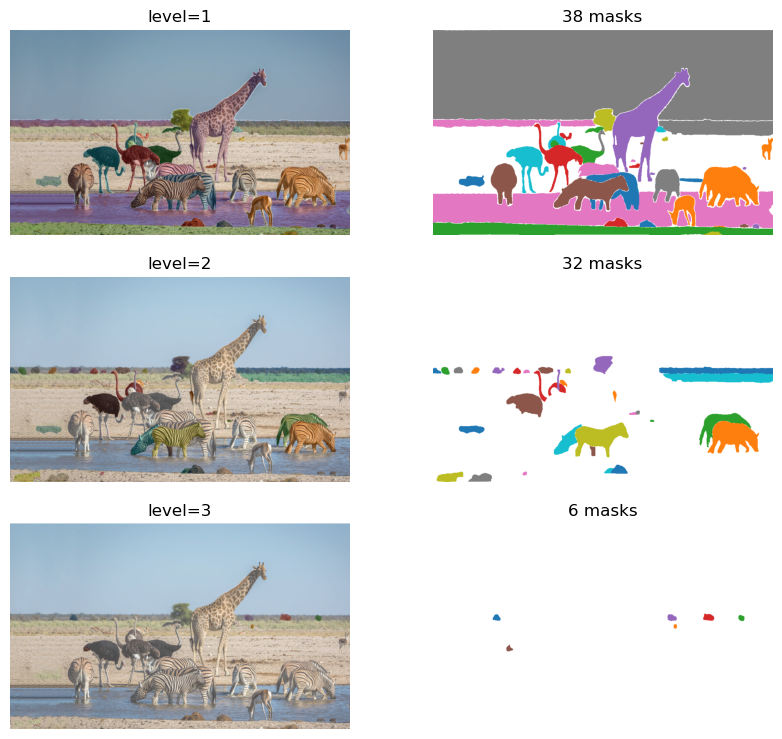

In [36]:
tree_seg = TreePredictor(
    model, 
    box_nms_thresh=0.8,               
    pred_iou_thresh = 0.88,
    stability_score_thresh = 0.95,
)
print("Generating tree.")
prediction = tree_seg.tree_generate(image_resized, device=device, verbose=0, max_steps=100)
# prediction.print_tree()
print(f"num of masks: {prediction.num_masks}")
show_all_levels(image_resized, prediction)

Generating tree.


num of masks: 72


4

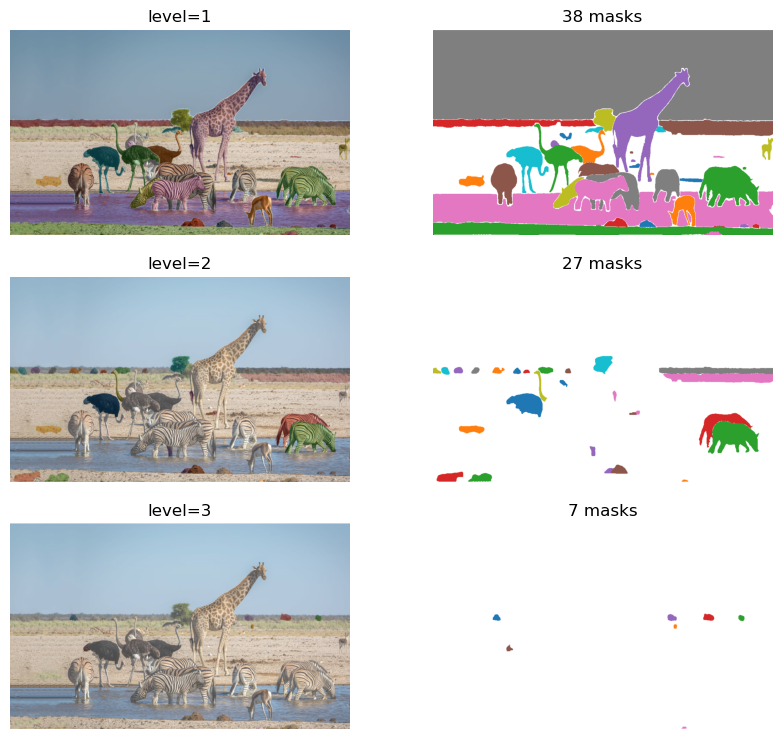

In [37]:
tree_seg = TreePredictor(
    model, 
    box_nms_thresh=0.7
    ,               
    pred_iou_thresh = 0.88,
    stability_score_thresh = 0.95,
)
print("Generating tree.")
prediction = tree_seg.tree_generate(image_resized, device=device, verbose=0, max_steps=100)
# prediction.print_tree()
print(f"num of masks: {prediction.num_masks}")
show_all_levels(image_resized, prediction)

Generating tree.


num of masks: 68


4

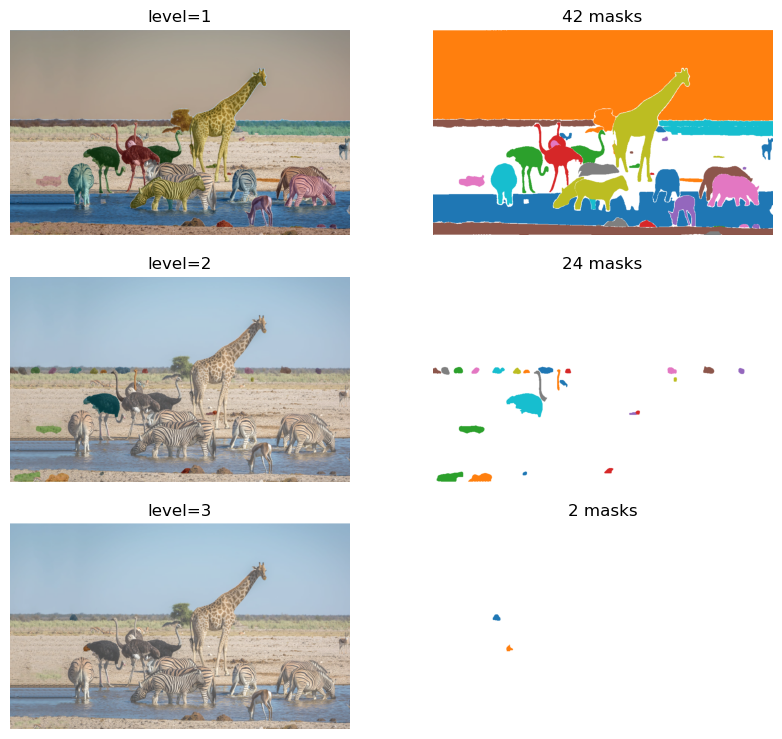

In [38]:
tree_seg = TreePredictor(
    model, 
    box_nms_thresh=0.5,               
    pred_iou_thresh = 0.88,
    stability_score_thresh = 0.95,
)
print("Generating tree.")
prediction = tree_seg.tree_generate(image_resized, device=device, verbose=0, max_steps=100)
# prediction.print_tree()
print(f"num of masks: {prediction.num_masks}")
show_all_levels(image_resized, prediction)

Generating tree.
num of masks: 73


4

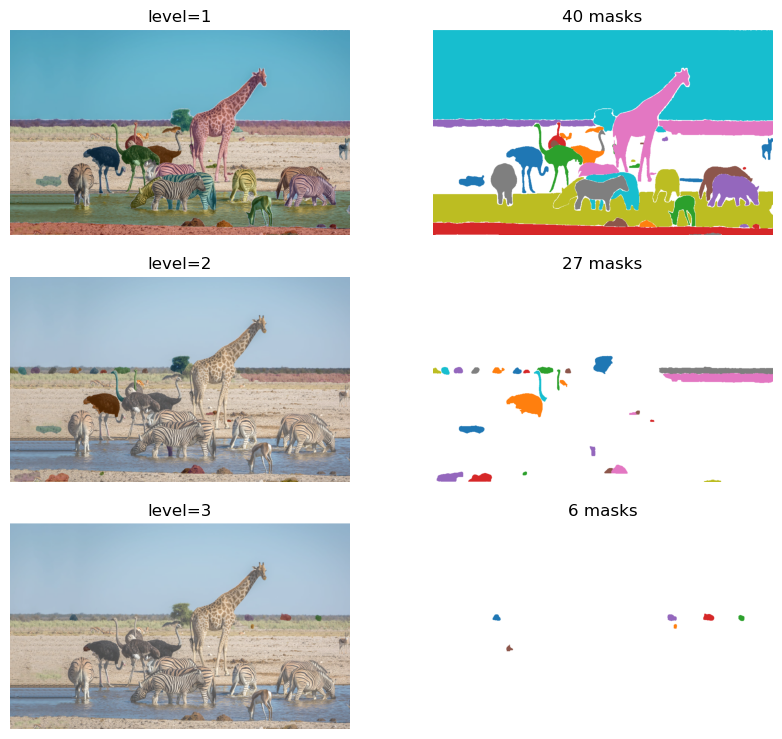

In [39]:
tree_seg = TreePredictor(
    model, 
    box_nms_thresh=0.7,               
    pred_iou_thresh = 0.88,
    stability_score_thresh = 0.95,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
)
print("Generating tree.")
prediction = tree_seg.tree_generate(image_resized, device=device, verbose=0, max_steps=100)
# prediction.print_tree()
print(f"num of masks: {prediction.num_masks}")
show_all_levels(image_resized, prediction)

下面更改crops参数

Generating tree.


num of masks: 73


4

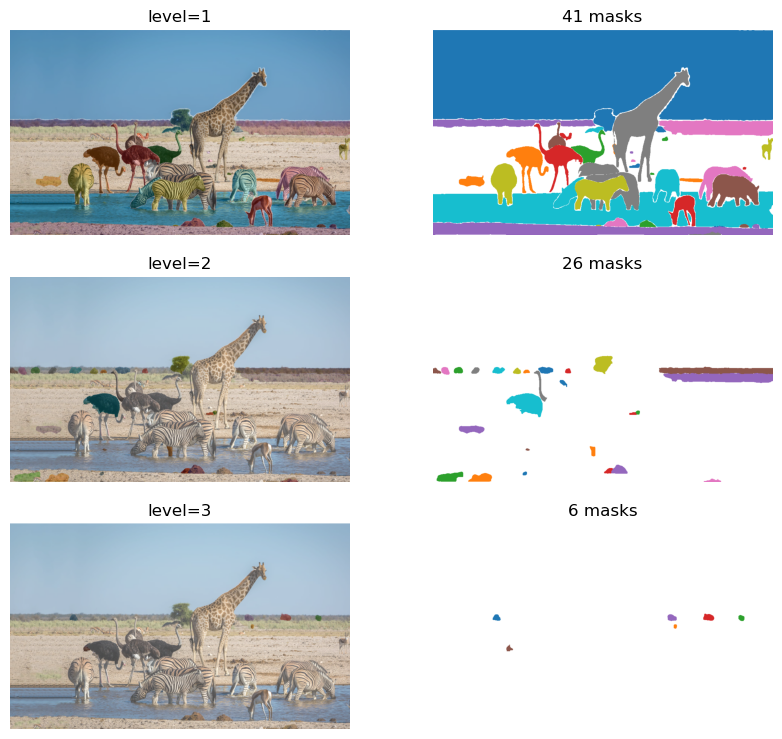

In [40]:
tree_seg = TreePredictor(
    model, 
    box_nms_thresh=0.7,               
    pred_iou_thresh = 0.88,
    stability_score_thresh = 0.95,
    crop_n_layers=2,
    crop_n_points_downscale_factor=2,
)
print("Generating tree.")
prediction = tree_seg.tree_generate(image_resized, device=device, verbose=0, max_steps=100)
# prediction.print_tree()
print(f"num of masks: {prediction.num_masks}")
show_all_levels(image_resized, prediction)

Generating tree.


num of masks: 74


4

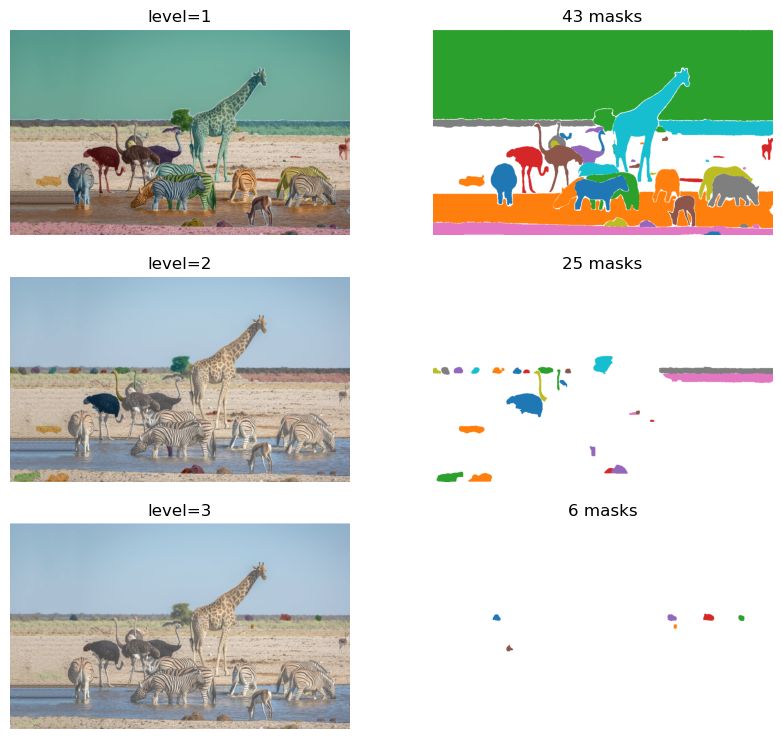

In [41]:
tree_seg = TreePredictor(
    model, 
    box_nms_thresh=0.7,               
    pred_iou_thresh = 0.88,
    stability_score_thresh = 0.95,
    crop_n_layers=5,
    crop_n_points_downscale_factor=2,
)
print("Generating tree.")
prediction = tree_seg.tree_generate(image_resized, device=device, verbose=0, max_steps=100)
# prediction.print_tree()
print(f"num of masks: {prediction.num_masks}")
show_all_levels(image_resized, prediction)

Generating tree.


num of masks: 76


4

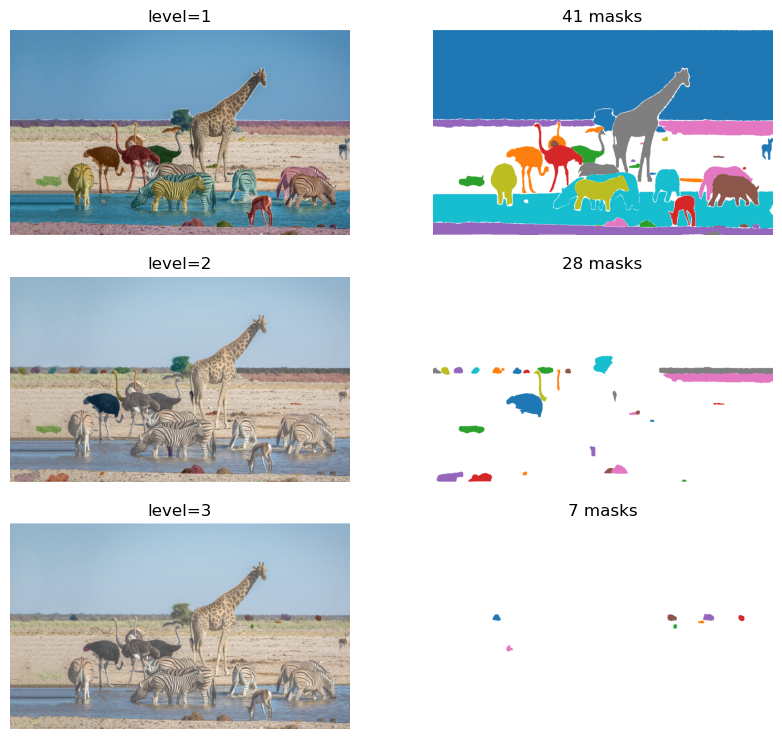

In [42]:
tree_seg = TreePredictor(
    model, 
    box_nms_thresh=0.7,               
    pred_iou_thresh = 0.88,
    stability_score_thresh = 0.95,
    crop_n_layers=3,
    crop_n_points_downscale_factor=3,
)
print("Generating tree.")
prediction = tree_seg.tree_generate(image_resized, device=device, verbose=0, max_steps=100)
# prediction.print_tree()
print(f"num of masks: {prediction.num_masks}")
show_all_levels(image_resized, prediction)

总结：
- 对于Semantic-SAM:
   - 降低`pred_iou_thresh`可以增加masks个数，但提高不多；同时对层数影响不大；
   - 降低`stability_score_thresh`可以显著增加masks个数，同时可以显著增加层数，但该值降低将降低mask质量（使本应被分开的部分出现粘连，甚至mask被合并）
   - 降低`box_nms_thresh`对mask数量的影像不大
- 对于SAM:
   - 在此图片上，SAM效果明显优于Semantic-SAM
   - 降低`pred_iou_thresh`可以明显增加masks个数，但同时对层数影响不大；
   - 降低`stability_score_thresh`可以显著增加masks个数，同时可以显著增加层数，但在SAM下其增加mask的效果不如降低iou的效果；同时该值降低将降低mask质量（同样，使本应被分开的部分出现粘连）
   - 降低`box_nms_thresh`对mask数量的影像不大